In [4]:
import os
import numpy as np
import glob
from nibabel import processing
import nibabel as nib
import matplotlib.pyplot as plt
%matplotlib inline
import itertools 
from matplotlib.figure import Figure                       
from matplotlib.axes import Axes                           
import nibabel
import os
import numpy as np
import SimpleITK as sitk
import glob
from nibabel import processing
import nibabel as nib
import scipy
from scipy import ndimage
from scipy.spatial.distance import pdist
import pandas as pd
import xlrd
import matplotlib.pyplot as plt
%matplotlib inline
import itertools 
from matplotlib.figure import Figure                       
from matplotlib.axes import Axes                           
from matplotlib.lines import Line2D                        
import itertools
import copy
import numbers
import collections
import numpy as np
from scipy import ndimage
from scipy.stats import scoreatpercentile
from sklearn.externals.joblib import Memory
from nilearn import masking
from nilearn.input_data import NiftiMapsMasker
from nilearn._utils import check_niimg, check_niimg_3d, check_niimg_4d
from nilearn.image import new_img_like, resample_img
from nilearn.image.image import _smooth_array, threshold_img
from nilearn._utils.niimg_conversions import concat_niimgs, _check_same_fov
from nilearn._utils.niimg import _safe_get_data
from nilearn._utils.compat import _basestring
from nilearn._utils.ndimage import _peak_local_max
from nilearn._utils.segmentation import _random_walker
import nilearn
from nilearn import image
import dicom

/Users/Paul/miniconda2/envs/python3/lib/python3.5/site-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [37]:
name_model="./W2_denseUnetsmall160_multimodal3D_w_Dice/output/"

In [38]:
path_modified=name_model+'modified_gt/'

In [45]:
ls_mask_modifiedgt=glob.glob(path_modified+'*.nii*')
ls_mask_pred=glob.glob('./W2_denseUnetsmall160_multimodal3D_w_Dice/output/'+'*.nii.gz')

In [46]:
#ls_mask=glob.glob('/Users/Paul/Documents/articles/Perso/segmentation_test/data_3D/'+'*3D*.nii*')

In [47]:
ls_id_pred=sorted(list(map(lambda x:x.split('/')[-1].split('_')[0],ls_mask_pred)))
ls_id_gt=sorted(list(map(lambda x:x.split('/')[-1].split('_')[1][11:],ls_mask_modifiedgt)))

In [49]:
ls_id_pred

['11011101021002',
 '11011101021008',
 '11011101021014',
 '11011101031003',
 '11011101051009',
 '11011101051015',
 '11011101051026',
 '11011101061010',
 '11011101071015',
 '11011101071028',
 '11011101071031',
 '11011101091010',
 '11011101091011',
 '11011101091017',
 '11011101091019',
 '11011101091022',
 '11011101141002',
 '11011101151005',
 '11011101171005',
 '11011101191005',
 '11011101211003',
 '11011101211005',
 '11011101211010',
 '11011101211012',
 '11011101221018',
 '11011101221027',
 '11011101231004',
 '11011101241002',
 '11011101241004',
 '11011101241005',
 '11011101241006',
 '11011101241009',
 '11011101251006',
 '11011101251011',
 '11011101251012',
 '11011101281003',
 '11011101331007',
 '11011101331008',
 '11011101331010',
 '11011101331012',
 '11011101341001',
 '11011101341004',
 '11011101391006',
 '11011101391011',
 '11011101391019',
 '11011101441003',
 '11011101461006',
 '11011101541001',
 '11011101641002',
 '11011101761015',
 '11011102081001',
 '11011102321002',
 '1101110232

In [48]:
ls_mask_modifiedgt

['./W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011106051004_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions51011103071003_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011102321009_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011101071031_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011101171005_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011101091022_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011109131005_modified_gtseg.nii.gz',
 './W2_denseUnetsmall160_multimodal3D_w_Dice/output/modified_gt/modified_predictions11011101241005_modified_gtseg.nii.gz',
 './W2_denseUnet

In [33]:
import matplotlib

In [17]:
def img3D_to_MIP(image_data):
    MIP=np.amax(image_data,axis=1)
    MIP=np.rot90(MIP[::-1,:])
    return(MIP)
def img3D_to_MIP90(image_data):
    data_img=scipy.rot90(image_data)
    MIP=np.amax(data_img,axis=1)
    MIP=np.rot90(MIP[::-1,:])
    return(MIP)

In [18]:

def DICE_array(seg,gt,k=1):
    return  np.sum(seg[gt==k])*2.0 / (np.sum(seg) + np.sum(gt))
from skimage import measure

def get_contigency_from_mask_pred(mask_data,pred_data):
    
    connected_companent_array,num_label=measure.label(mask_data,return_num=True)
    FN=0
    VP=0
    FP=0
    id_fn=[]
    id_fp=[]
    for i in range(1,num_label+1):
        if ((connected_companent_array==i)*1*pred_data).sum()==0:
            FN+=1
            id_fn.append((connected_companent_array==i)*1)
        else:
            VP+=1
            
    connected_companent_array_pred,num_label_pred=measure.label(pred_data,return_num=True)
    for i in range(1,num_label_pred+1):
        if ((connected_companent_array_pred==i)*1*mask_data).sum()==0:
            FP+=1
            id_fp.append((connected_companent_array_pred==i)*1)
        else:
            pass

    try:
        id_fn=np.stack(id_fn,axis=-1)
    except:
        id_fn=np.zeros(connected_companent_array.shape)
    if len(id_fn.shape)>3:
        id_fn=np.max(id_fn,axis=-1)
    
    try:
        id_fp=np.stack(id_fp,axis=-1)
    except:
        id_fp=np.zeros(connected_companent_array.shape)
    if len(id_fp.shape)>3:
        id_fp=np.max(id_fp,axis=-1)
    
    return FN,VP,FP,id_fn,id_fp

In [19]:
from tqdm import tqdm
#ls_id=['11011101331012']


 12%|█▏        | 11/92 [03:37<31:30, 23.34s/it]

KeyboardInterrupt: 

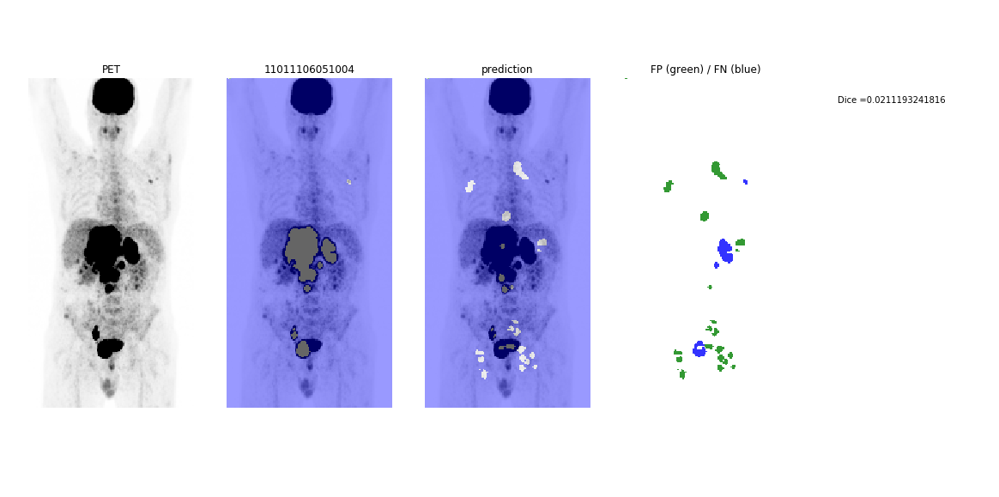

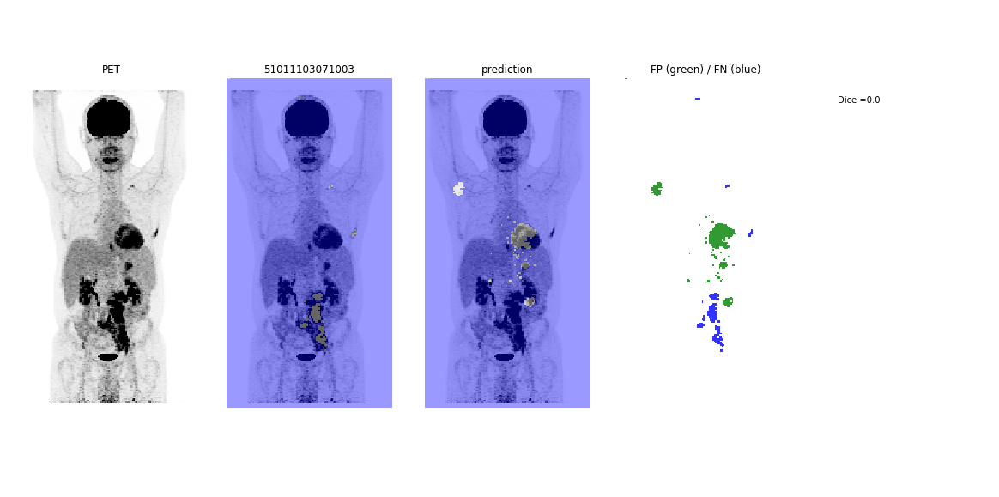

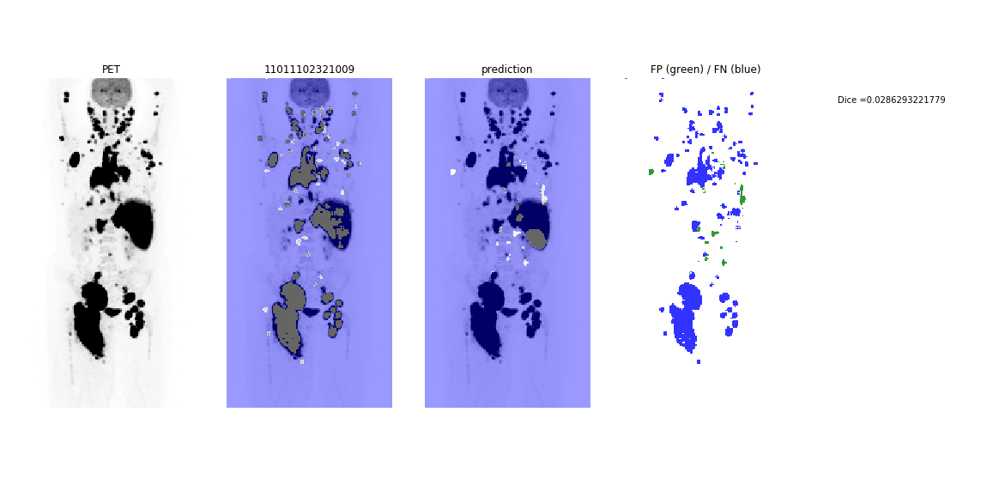

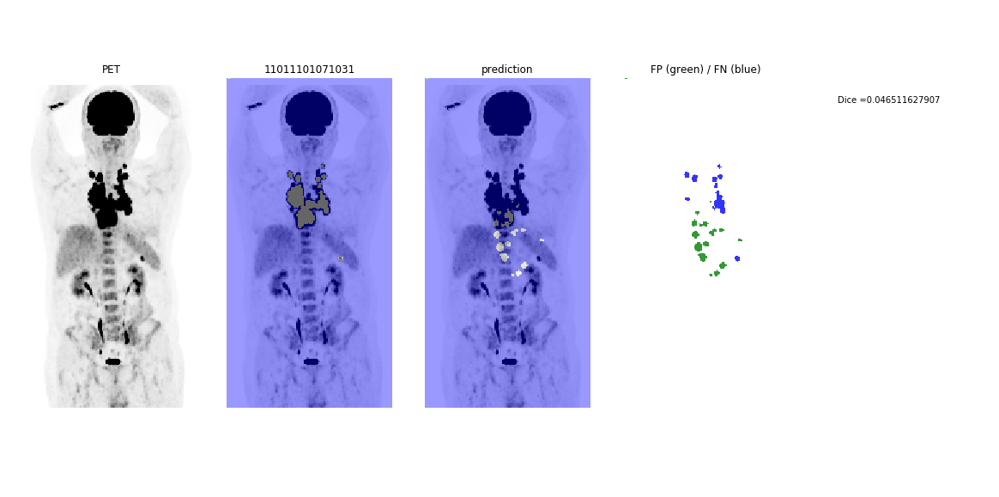

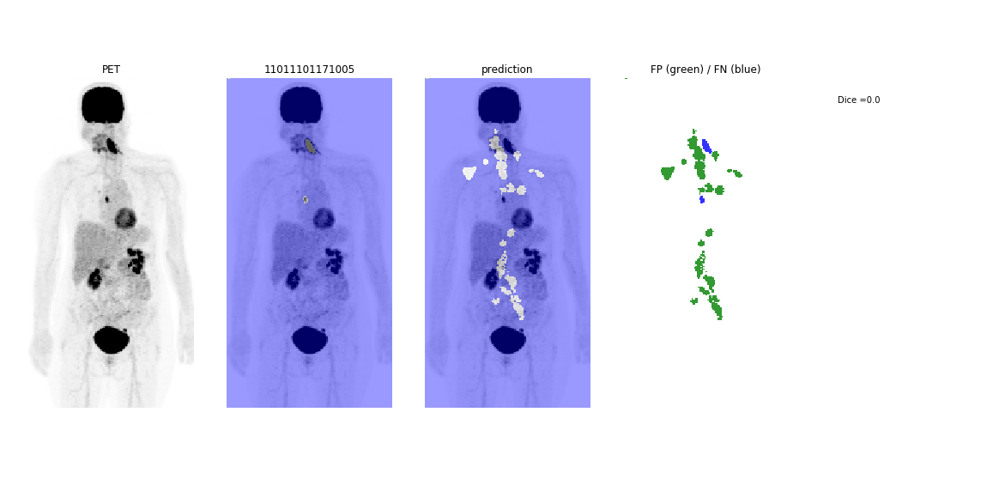

...

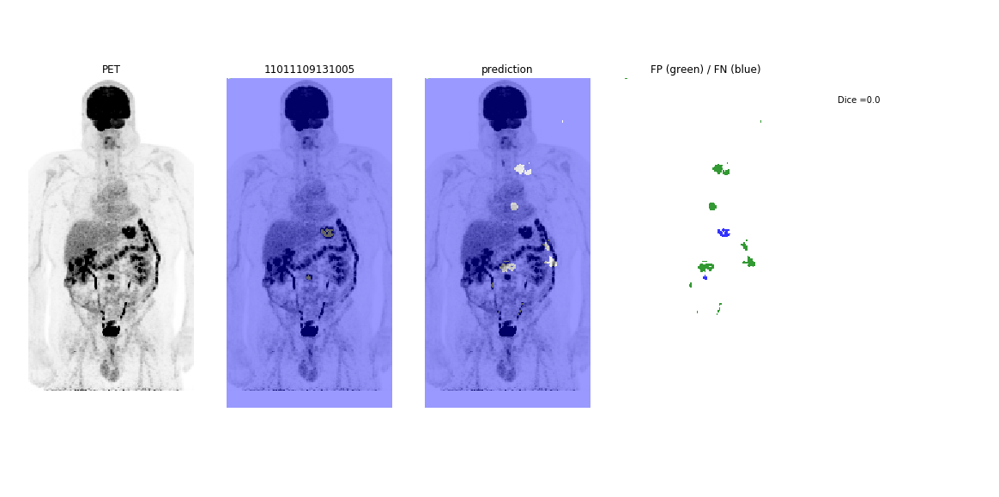

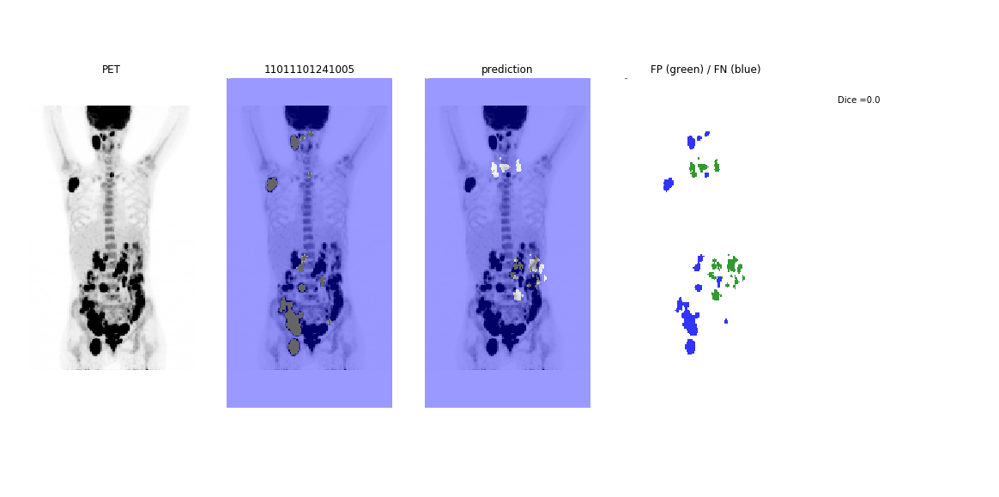

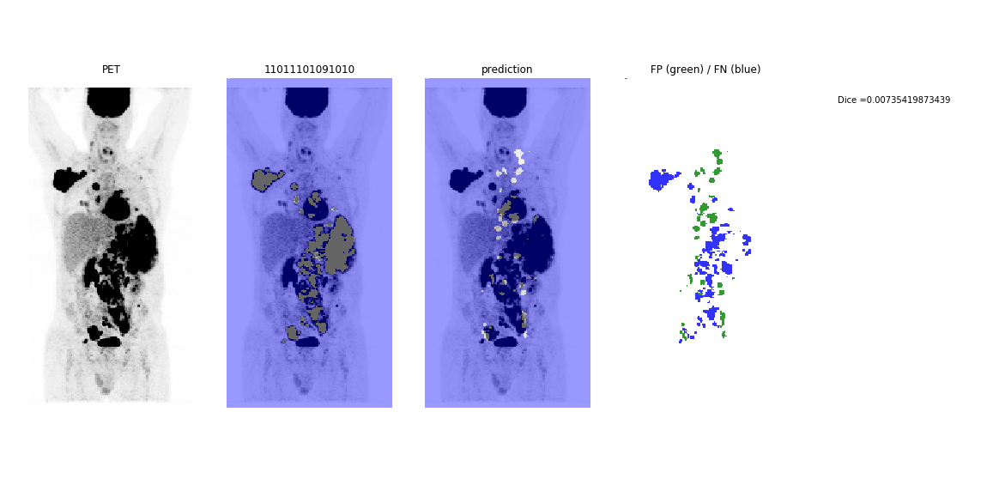

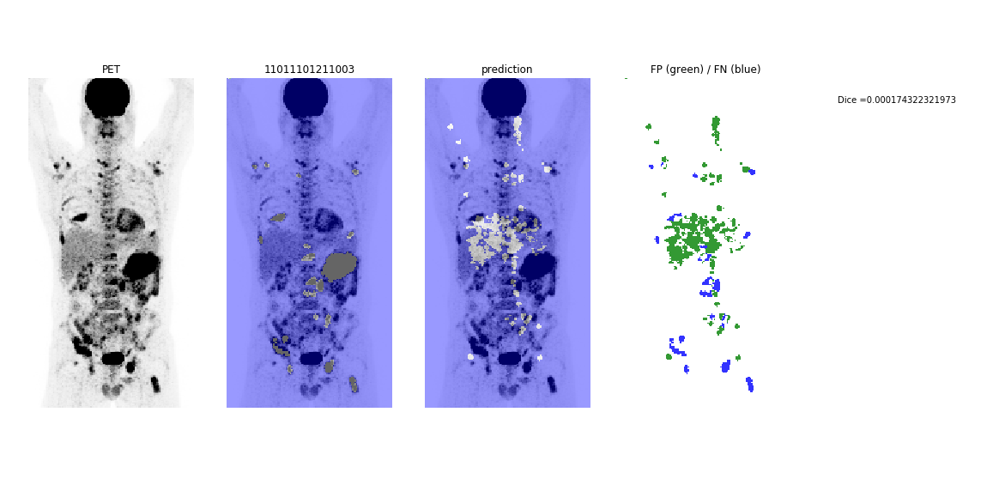

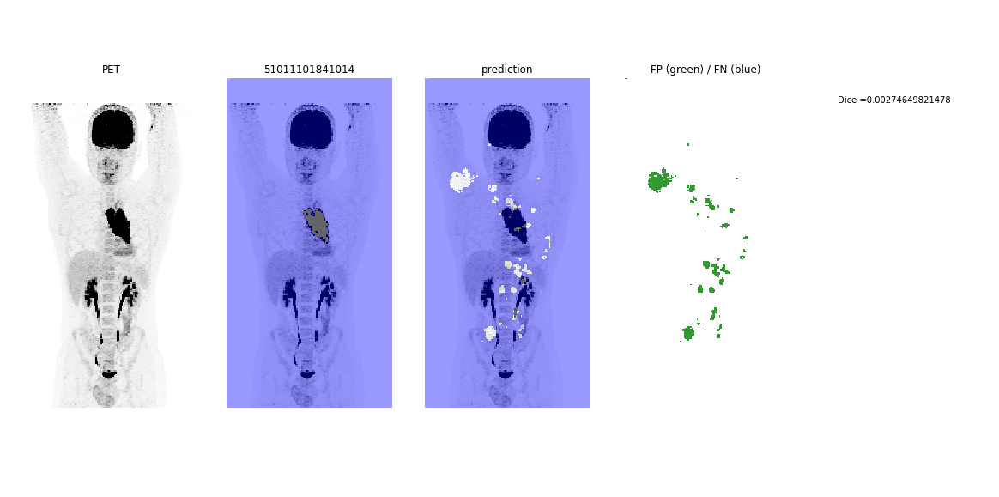

In [50]:
ls_param_p=[]
colors = ['blue','white','green']
for i in tqdm(range(len(ls_id_pred))):
#for i in np.arange(1,2):
    #try:
        id_p=ls_id[i]
        gt_img=nib.load('/Volumes/PAULBD2018/GAINED_data/GAINED_dataset_cleaned/Validation/'+id_p+'_3Dmask.nii')
        pet_img=nib.load('/Volumes/PAULBD2018/GAINED_data/GAINED_dataset_cleaned/Validation/'+id_p+'_pet.nii')

        mask_img=compute_mask_threshold(gt_img,pet_img)

        pred_img=nib.load(ls_mask_pred[i])
        while len(pred_img.shape)>3:
            pred_img=nib.squeeze_image(pred_img)
        pred_img=compute_mask_threshold(pred_img,pet_img)



        mask_data=mask_img.get_data()[:,:,:]
        if len((pred_img.get_data().shape))>3:
            pred_data=pred_img.get_data()[:,:,:,0,0]
        else:
            pred_data=pred_img.get_data()[:,:,:]


        pred_data=(pred_data>0.5)*1
        pet_data=pet_img.get_data()
        MIP_pet=img3D_to_MIP(pet_data)
        #MIP_pet_normalized=img3D_to_MIP(pet_img_normalized)
        #MIP_pet90=img3D_to_MIP90(pet_img)
        MIP_mask=img3D_to_MIP(mask_data)

        #MIP_mask90=img3D_to_MIP90(mask_img)
        MIP_pred=img3D_to_MIP(pred_data)
        
        # FOR COLOR SCALES
        MIP_mask[0,0]=0
        MIP_mask[0,1]=1
        MIP_mask[0,2]=2

        MIP_pred[0,0]=0
        MIP_pred[0,1]=1
        MIP_pred[0,2]=2
        
        dice=DICE_array(pred_data,mask_data)
        MTV_pred=pred_data.sum()
        MTV_gt=mask_data.sum()
        FN,VP,FP,id_fn,id_fp=get_contigency_from_mask_pred(mask_data,pred_data)
        VN_vox=np.sum((1-mask_data)*(1-pred_data))
        VP_vox=np.sum((mask_data)*(pred_data))
        FP_vox=np.sum(pred_data*(1-mask_data))
        FN_vox=np.sum((1-pred_data)*mask_data)

        
        ls_param_p.append([id_p,dice,MTV_pred,MTV_gt,FN,VP,FP,FN_vox,VP_vox,FP_vox,VN_vox])
        
        mip_fp=img3D_to_MIP(id_fp)
        mip_fn=img3D_to_MIP(id_fn)

        MIP_pred_fp=mip_fp-mip_fn
        MIP_pred_fp[0,0]=0
        MIP_pred_fp[0,1]=1
        MIP_pred_fp[0,2]=2

        MIP_pred_fp[0,1]=2
        fig,(ax1,ax2,ax3,ax4,ax5)=plt.subplots(1,5,figsize=(20,10))
        ax1.imshow(MIP_pet,vmax=5,cmap='Greys')
        ax1.set_axis_off()
        ax1.set_title('PET')
        ax2.imshow(MIP_pet,vmax=5,cmap='Greys')
        ax2.imshow(MIP_mask,alpha=0.4,cmap=matplotlib.colors.ListedColormap(colors))
        ax2.set_axis_off()

        ax2.set_title(id_p) 
        ax3.set_axis_off()
        ax3.imshow(MIP_pet,vmax=5,cmap='Greys')
        ax3.imshow(MIP_pred,alpha=0.4,cmap=matplotlib.colors.ListedColormap(colors))
        ax4.set_axis_off()
        ax3.set_title('prediction')
        ax4.set_title('FP (green) / FN (blue)')

        #ax4.imshow(MIP_pet,vmax=5,cmap='Greys')
        ax4.imshow(MIP_pred_fp,alpha=0.8,cmap=matplotlib.colors.ListedColormap(colors))
        
        ax5.set_axis_off()
        ax5.text(0.1, 0.8, 'Dice ='+str(dice), transform=ax5.transAxes)
        try: 
            os.makedirs(name_model+'/mip_'+name_model.split('/')[-2])
        except:
            pass
        fig.savefig(name_model+'/mip_'+name_model.split('/')[-2]+'/'+id_p+'.jpg')
    #except:
        #pass


In [24]:
###
#erosion first
def compute_mask_threshold(mask_img,pet_img,threshold=0.41):
    pet_data=pet_img.get_data()
    mask_component,_=measure.label(mask_img.get_data(),return_num=True)
    mask_thresholded41=np.zeros(mask_component.shape)
    for j in np.arange(1,mask_component.max()+1):
        threshold41=threshold*np.max((mask_component==j)*pet_data)
        mask_thresholded41+= (pet_data>threshold41)*1*(mask_component==j)*1
    mask_thresholded41=(mask_thresholded41>0)*1
    mask_thresholded41=nib.Nifti1Image(mask_thresholded41,mask_img.affine)
    return mask_thresholded41
from matplotlib import patches

In [54]:
ls_mask_pred[i]

'./W2_denseUnetsmall160_multimodal3D_w_Dice/output/11011101071028_niftynet_out.nii.gz'





  0%|          | 0/93 [00:00<?, ?it/s]

11011106051004






  1%|          | 1/93 [00:02<03:48,  2.48s/it]

51011103071003






  2%|▏         | 2/93 [00:06<04:16,  2.82s/it]

11011102321009






  3%|▎         | 3/93 [00:22<10:31,  7.01s/it]

11011101071031






  4%|▍         | 4/93 [00:26<08:53,  6.00s/it]

11011101171005






  5%|▌         | 5/93 [00:28<06:56,  4.74s/it]

11011101091022






  6%|▋         | 6/93 [00:29<05:21,  3.70s/it]

11011109131005






  8%|▊         | 7/93 [00:32<04:46,  3.33s/it]

11011101241005






  9%|▊         | 8/93 [00:40<06:47,  4.80s/it]

11011101091010






 10%|▉         | 9/93 [00:50<09:02,  6.46s/it]

11011101211003






 11%|█         | 10/93 [00:59<09:51,  7.13s/it]

51011101841014






 12%|█▏        | 11/93 [01:00<07:23,  5.41s/it]

51011101811004






 13%|█▎        | 12/93 [01:13<10:27,  7.75s/it]

11011101071015






 14%|█▍        | 13/93 [01:23<11:14,  8.43s/it]

51011102171001






 15%|█▌        | 14/93 [01:34<11:59,  9.11s/it]

11011101061010






 16%|█▌        | 15/93 [01:53<15:44, 12.11s/it]

11011102641001






 17%|█▋        | 16/93 [02:06<15:38, 12.19s/it]

11011101341001






 18%|█▊        | 17/93 [02:12<13:10, 10.41s/it]

51011103011004






 19%|█▉        | 18/93 [02:14<09:59,  7.99s/it]

51011102181001






 20%|██        | 19/93 [02:18<08:26,  6.84s/it]

51011103071001






 22%|██▏       | 20/93 [02:23<07:30,  6.17s/it]

11011101391011


/Users/Paul/miniconda2/envs/python3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)




 23%|██▎       | 21/93 [02:28<07:01,  5.85s/it]

11011102541002






 24%|██▎       | 22/93 [02:30<05:34,  4.71s/it]

11011101441003






 25%|██▍       | 23/93 [02:42<08:07,  6.97s/it]

51011101881009






 26%|██▌       | 24/93 [02:47<07:16,  6.32s/it]

11011101391019






 27%|██▋       | 25/93 [02:51<06:18,  5.57s/it]

11011108371001






 28%|██▊       | 26/93 [02:53<05:02,  4.51s/it]

51011101881019






 29%|██▉       | 27/93 [02:56<04:24,  4.01s/it]

11011101151005






 30%|███       | 28/93 [02:58<03:44,  3.46s/it]

51011103031010






 31%|███       | 29/93 [02:59<03:01,  2.83s/it]

11011106131003






 32%|███▏      | 30/93 [03:14<06:31,  6.22s/it]

51011101371019






 33%|███▎      | 31/93 [03:21<06:49,  6.60s/it]

51011103011002






 34%|███▍      | 32/93 [03:24<05:33,  5.46s/it]

11011101141002






 35%|███▌      | 33/93 [03:28<05:06,  5.10s/it]

11011101241009






 37%|███▋      | 34/93 [03:33<04:52,  4.96s/it]

11011101251006






 38%|███▊      | 35/93 [03:38<04:55,  5.09s/it]

51011101831004






 39%|███▊      | 36/93 [03:41<04:08,  4.36s/it]

11011101051015






 40%|███▉      | 37/93 [03:43<03:26,  3.68s/it]

11011101331007






 41%|████      | 38/93 [04:14<10:52, 11.86s/it]

11011101051009






 42%|████▏     | 39/93 [04:17<08:18,  9.23s/it]

11011101211005






 43%|████▎     | 40/93 [04:21<06:40,  7.56s/it]

51011101371021






 44%|████▍     | 41/93 [04:26<06:02,  6.96s/it]

11011101641002






 45%|████▌     | 42/93 [04:30<05:08,  6.05s/it]

51011101831006






 46%|████▌     | 43/93 [04:35<04:45,  5.70s/it]

11011101241009






 47%|████▋     | 44/93 [04:39<04:13,  5.18s/it]

51011103071005






 48%|████▊     | 45/93 [04:41<03:29,  4.37s/it]

11011106051002






 49%|████▉     | 46/93 [05:00<06:43,  8.59s/it]

11011101251012






 51%|█████     | 47/93 [05:05<05:48,  7.57s/it]

11011101221018






 52%|█████▏    | 48/93 [05:10<05:04,  6.76s/it]

11011101541001






 53%|█████▎    | 49/93 [05:14<04:23,  5.99s/it]

11011101091011






 54%|█████▍    | 50/93 [05:20<04:14,  5.91s/it]

11011108371004






 55%|█████▍    | 51/93 [05:34<05:49,  8.32s/it]

11011101241004






 56%|█████▌    | 52/93 [05:37<04:32,  6.66s/it]

11011101091019






 57%|█████▋    | 53/93 [05:39<03:40,  5.52s/it]

51011101111002






 58%|█████▊    | 54/93 [05:43<03:10,  4.88s/it]

51011102181002






 59%|█████▉    | 55/93 [05:45<02:35,  4.10s/it]

11011109131004






 60%|██████    | 56/93 [05:50<02:44,  4.44s/it]

11011101331008






 61%|██████▏   | 57/93 [06:02<04:00,  6.69s/it]

11011101031003






 62%|██████▏   | 58/93 [06:05<03:08,  5.39s/it]

11011101241006






 63%|██████▎   | 59/93 [06:07<02:34,  4.54s/it]

11011102321002






 65%|██████▍   | 60/93 [06:15<03:00,  5.47s/it]

11011101221027






 66%|██████▌   | 61/93 [06:20<02:53,  5.44s/it]

11011101461006






 67%|██████▋   | 62/93 [06:23<02:23,  4.62s/it]

11011101231004






 68%|██████▊   | 63/93 [06:27<02:11,  4.39s/it]

11011101391006






 69%|██████▉   | 64/93 [06:29<01:50,  3.80s/it]

11011106341005






 70%|██████▉   | 65/93 [06:31<01:32,  3.30s/it]

11011101251011






 71%|███████   | 66/93 [06:46<02:58,  6.60s/it]

11011101191005






 72%|███████▏  | 67/93 [06:49<02:27,  5.69s/it]

51011101711002






 73%|███████▎  | 68/93 [06:53<02:09,  5.18s/it]

11011101021008






 74%|███████▍  | 69/93 [06:58<02:01,  5.08s/it]

11011103051001






 75%|███████▌  | 70/93 [07:07<02:20,  6.13s/it]

11011101211010






 76%|███████▋  | 71/93 [07:11<02:02,  5.57s/it]

11011101051026






 77%|███████▋  | 72/93 [07:14<01:40,  4.77s/it]

11011101331012






 78%|███████▊  | 73/93 [07:21<01:51,  5.57s/it]

11011101761015






 80%|███████▉  | 74/93 [07:24<01:28,  4.64s/it]

11011107211001






 81%|████████  | 75/93 [07:30<01:30,  5.03s/it]

51011101731006






 82%|████████▏ | 76/93 [07:37<01:37,  5.71s/it]

11011101341004






 83%|████████▎ | 77/93 [07:51<02:14,  8.38s/it]

11011109131002






 84%|████████▍ | 78/93 [07:58<01:55,  7.73s/it]

11011101281003






 85%|████████▍ | 79/93 [08:02<01:33,  6.66s/it]

51011101831007






 86%|████████▌ | 80/93 [08:11<01:35,  7.38s/it]

51011101851002






 87%|████████▋ | 81/93 [08:15<01:18,  6.54s/it]

11011108041002






 88%|████████▊ | 82/93 [08:23<01:15,  6.90s/it]

11011106341011






 89%|████████▉ | 83/93 [08:34<01:20,  8.08s/it]

11011101331010






 90%|█████████ | 84/93 [08:39<01:03,  7.01s/it]

11011101021002






 91%|█████████▏| 85/93 [08:48<01:02,  7.78s/it]

51011101811003






 92%|█████████▏| 86/93 [08:53<00:47,  6.85s/it]

11011101021014






 94%|█████████▎| 87/93 [08:57<00:36,  6.05s/it]

11011102081001






 95%|█████████▍| 88/93 [09:06<00:34,  6.85s/it]

11011101071028






 96%|█████████▌| 89/93 [09:11<00:25,  6.34s/it]

11011101091017






 97%|█████████▋| 90/93 [09:14<00:16,  5.47s/it]

51011103031005






 98%|█████████▊| 91/93 [09:17<00:09,  4.66s/it]

11011101241002






 99%|█████████▉| 92/93 [09:31<00:07,  7.35s/it]

11011101211012






100%|██████████| 93/93 [09:33<00:00,  5.91s/it]





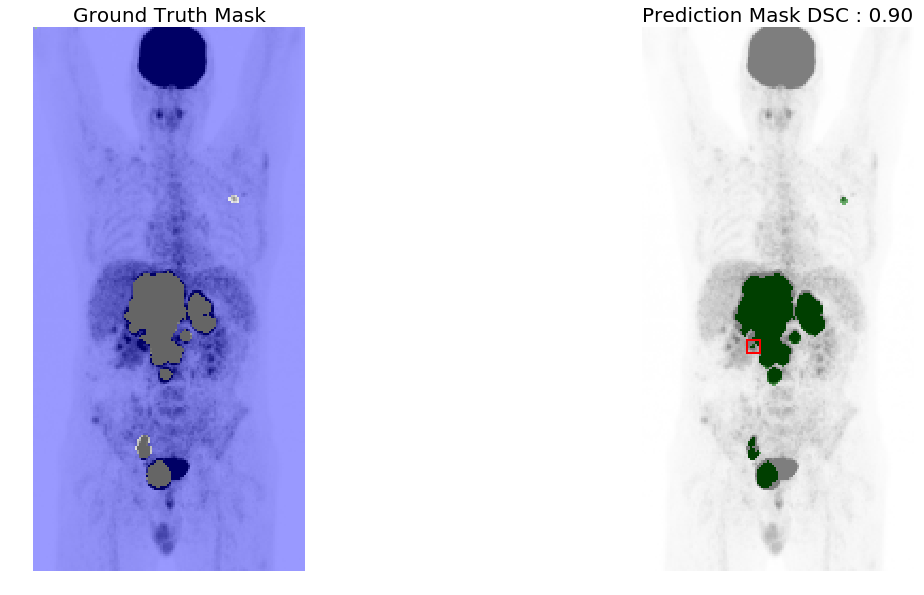

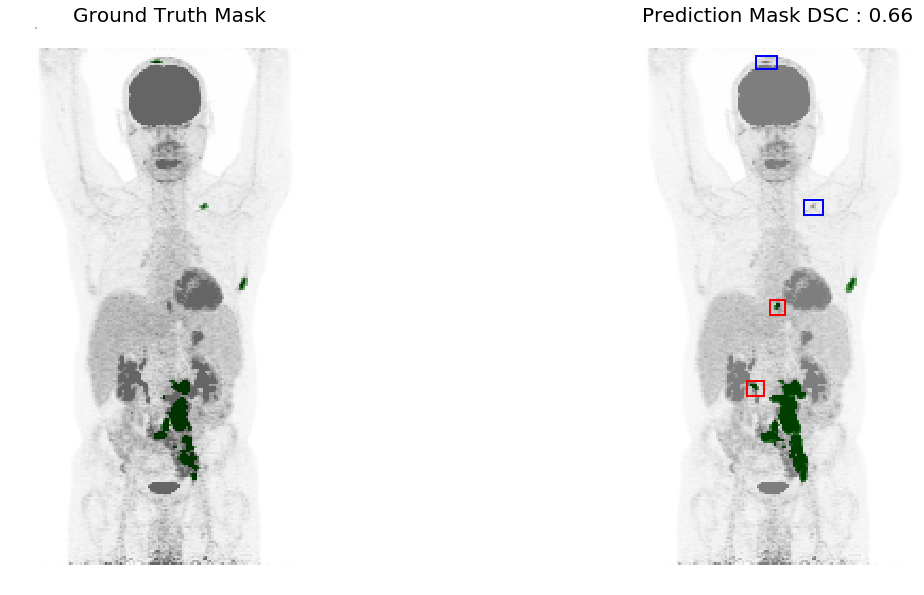

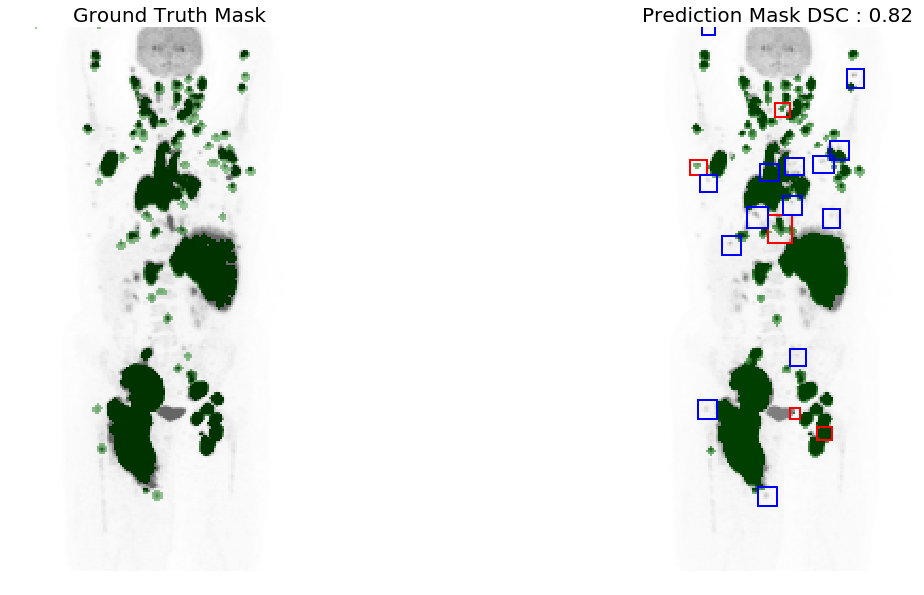

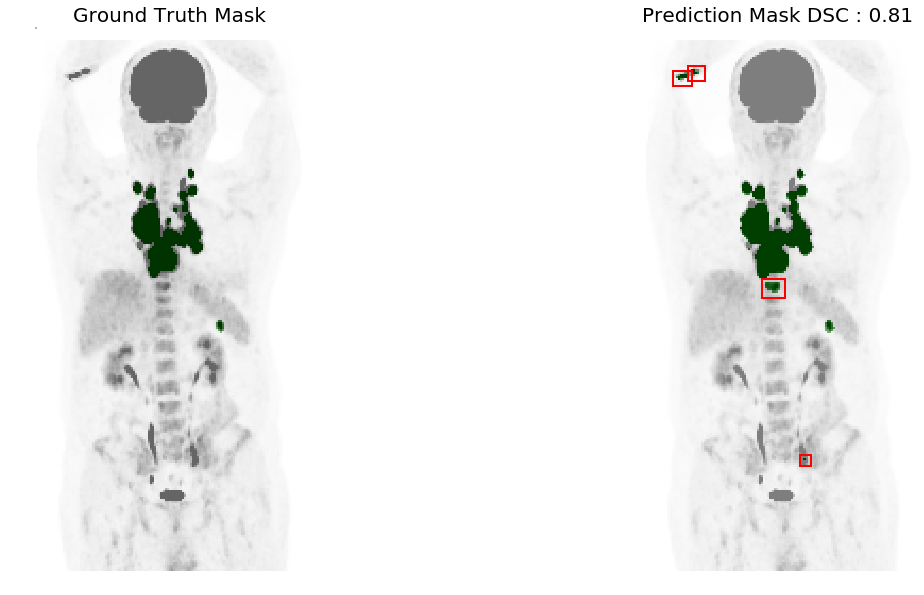

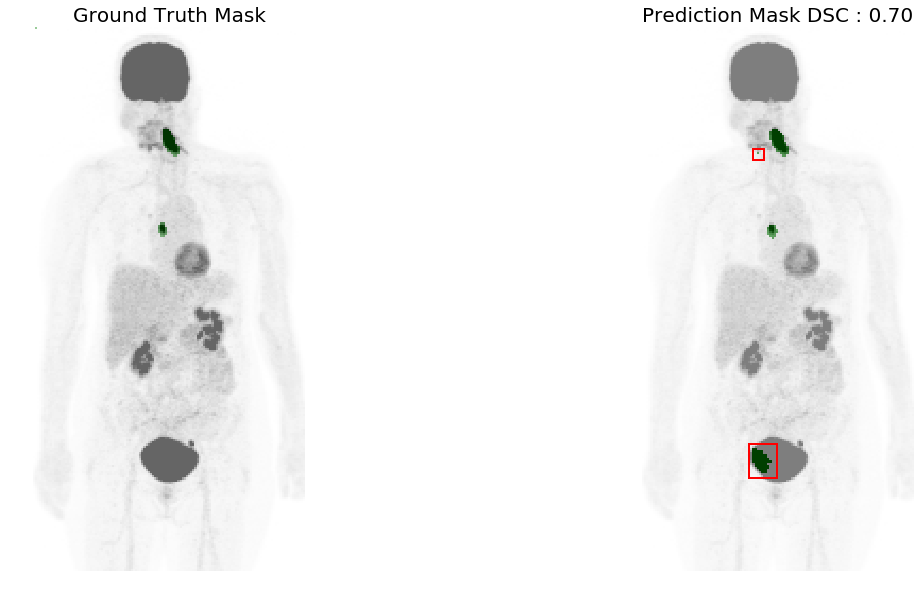

...

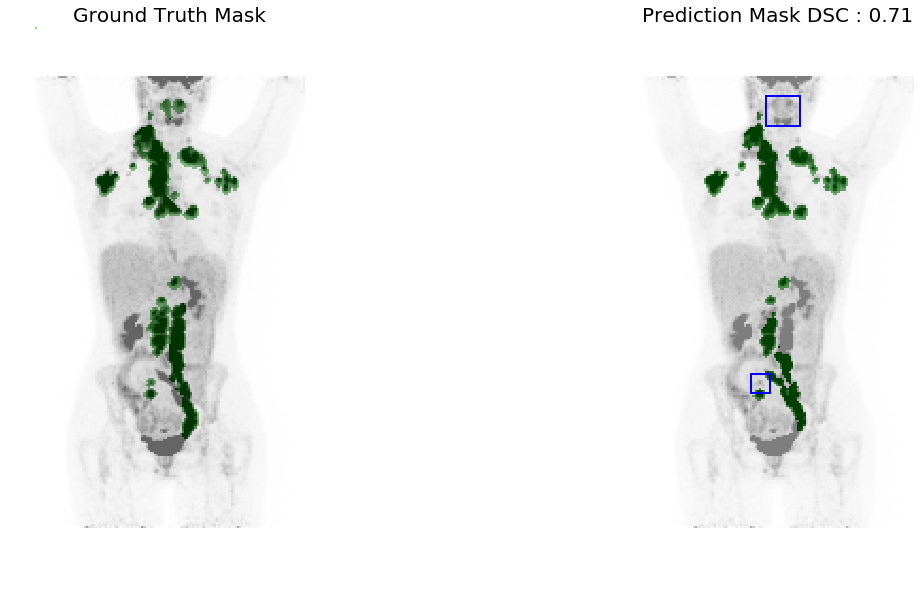

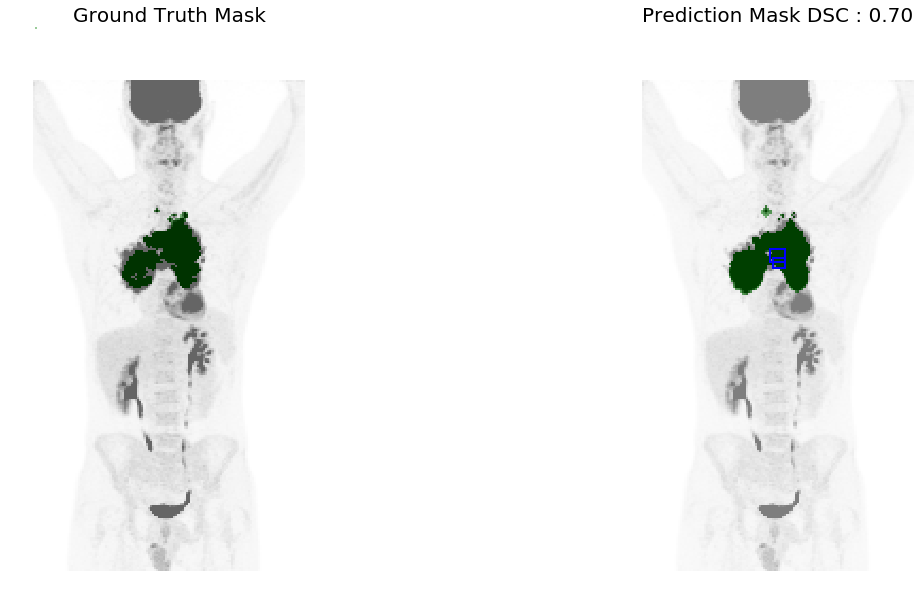

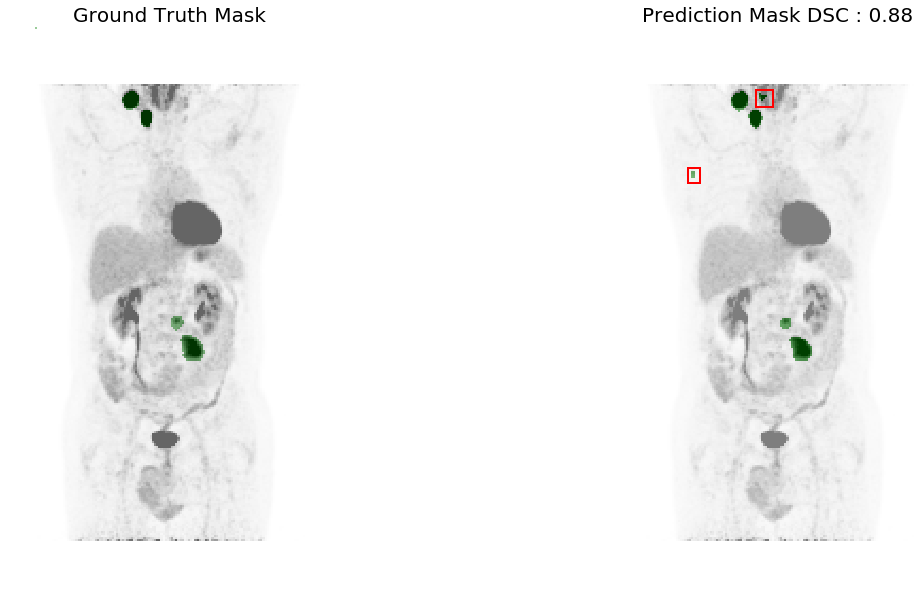

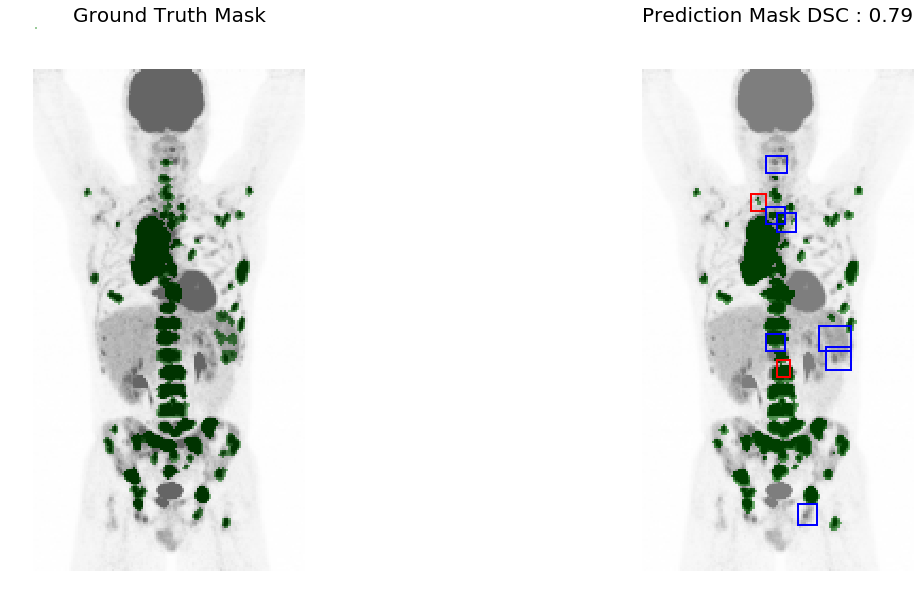

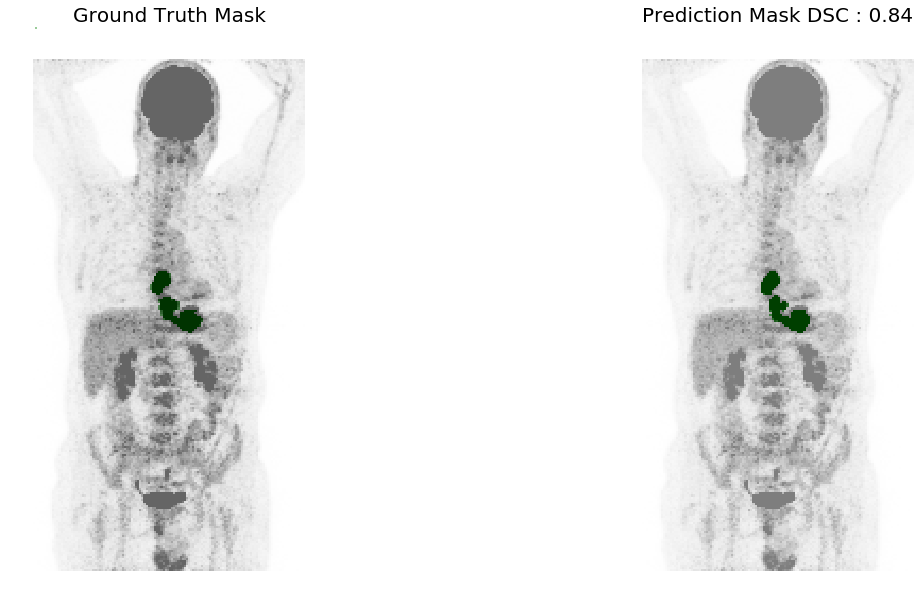

In [57]:
ls_param_p=[]
colors = ['blue','white','green']
for i in tqdm(range(len(ls_id))):
#for i in np.arange(1,2):
    #try:
        id_p=ls_id[i]
        print(id_p)
        gt_img=nib.load(path_modified+'modified_predictions'+id_p+'_modified_gtseg.nii.gz')

        #gt_img=nib.load('/Volumes/PAULBD2018/GAINED_data/GAINED_dataset_cleaned/Validation/'+id_p+'_3Dmask.nii')
        #gt_img=nib.Nifti1Image(ndimage.binary_erosion(gt_img.get_data(),iterations=1)*1,affine=gt_img.affine)
        pet_img=nib.load('/Volumes/PAULBD2018/GAINED_data/GAINED_dataset_cleaned/Validation/'+id_p+'_pet.nii')
        
        mask_img=gt_img
        #mask_img=compute_mask_threshold(gt_img,pet_img,threshold=0)

        pred_img=nib.load(name_model+id_p+'_niftynet_out.nii.gz')
        
        while len(pred_img.shape)>3:
            pred_img=nib.squeeze_image(pred_img)
            
        #pred_img=compute_mask_threshold(pred_img,pet_img,threshold=0)



        mask_data=mask_img.get_data()[:,:,:]
        if len((pred_img.get_data().shape))>3:
            pred_data=pred_img.get_data()[:,:,:,0,0]
        else:
            pred_data=pred_img.get_data()[:,:,:]


        pred_data=(pred_data>0.5)*1
        pet_data=pet_img.get_data()
        MIP_pet=img3D_to_MIP(pet_data)
        #MIP_pet_normalized=img3D_to_MIP(pet_img_normalized)
        #MIP_pet90=img3D_to_MIP90(pet_img)
        MIP_mask=img3D_to_MIP(mask_data)

        #MIP_mask90=img3D_to_MIP90(mask_img)
        MIP_pred=img3D_to_MIP(pred_data)
        
        # FOR COLOR SCALES

        dice=DICE_array(pred_data,mask_data)
        if dice==0 : dice=1
        MTV_pred=pred_data.sum()
        MTV_gt=mask_data.sum()
        FN,VP,FP,id_fn,id_fp=get_contigency_from_mask_pred(mask_data,pred_data)
        VN_vox=np.sum((1-mask_data)*(1-pred_data))
        VP_vox=np.sum((mask_data)*(pred_data))
        FP_vox=np.sum(pred_data*(1-mask_data))
        FN_vox=np.sum((1-pred_data)*mask_data)

        
        ls_param_p.append([id_p,dice,MTV_pred,MTV_gt,FN,VP,FP,FN_vox,VP_vox,FP_vox,VN_vox])
        
        #### POUR BBOX
        mip_fp=img3D_to_MIP(id_fp)
        mip_fn=img3D_to_MIP(id_fn)
        
        conn_fp=measure.label(mip_fp)
        props_fp=measure.regionprops(conn_fp)

        conn_fn=measure.label(mip_fn)
        props_fn=measure.regionprops(conn_fn)

        MIP_mask[0,0]=0
        MIP_mask[0,1]=1
        MIP_mask[0,1]=2
        
        fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
        ax1.set_axis_off()
        ax1.set_title('Ground Truth Mask',size=20)
        ax1.imshow(MIP_pet,vmax=5,cmap='Greys')
        ax1.imshow(MIP_mask,alpha=0.4,cmap=matplotlib.colors.ListedColormap(colors))
        ax1.set_axis_off()

        ax2.imshow(MIP_pet,vmax=5,cmap='Greys')
        for prop_fp in props_fp:
            ax2.add_patch(patches.Rectangle((prop_fp.bbox[1]-2, prop_fp.bbox[0]-2),
                prop_fp.bbox[3]-prop_fp.bbox[1]+4,
                prop_fp.bbox[2]-prop_fp.bbox[0]+4,
                fill=False,color='red',linewidth=2     # remove background
             ))
        colors = ['white','green']

        ax2.imshow(MIP_pred,alpha=0.5,cmap=matplotlib.colors.ListedColormap(colors))

        for prop_fn in props_fn:
            ax2.add_patch(patches.Rectangle((prop_fn.bbox[1]-2, prop_fn.bbox[0]-2),
                prop_fn.bbox[3]-prop_fn.bbox[1]+4,
                prop_fn.bbox[2]-prop_fn.bbox[0]+4,
                fill=False,color='blue',linewidth=2     # remove background
             ))
        ax2.set_axis_off()
        ax2.set_title('Prediction Mask DSC : {:.2f}'.format(dice),size=20)
        
       
        try: 
            os.makedirs(name_model+'/mip2_'+name_model.split('/')[-2])
        except:
            pass
        fig.savefig(name_model+'/mip2_'+name_model.split('/')[-2]+'/'+id_p+'.jpg')
    #except:
        #pass


In [58]:
pd_result=pd.DataFrame(ls_param_p)
pd_result.columns=['id','DSC','MTV_pred','MTV_gt',"FN","VP","FP","FN_vox","VP_vox","FP_vox","VN_vox"]
pd_result.to_excel(name_model+'patient.xlsx')

FN,VP,FP=pd_result[['FN','VP','FP']].sum()
#FP=FP/2
FN_vox,VP_vox,FP_vox,VN_vox=pd_result[['FN_vox','VP_vox','FP_vox','VN_vox']].sum()
#VP=VP+FP_vox/2
# Sensitivity, hit rate, recall, or true positive rate
Se = VP/(VP+FN)
Se_vox = VP_vox/(VP_vox+FN_vox)

# Specificity or true negative rate
Sp_vox = VN_vox/(VN_vox+FP_vox) 
# Precision or positive predictive value
VPP = VP/(VP+FP)
VPP_vox = VP_vox/(VP_vox+FP_vox)

# Negative predictive value
#VPN = VN/(VN+FN)
VPN_vox = VN_vox/(VN_vox+FN_vox)




# Overall accuracy
#ACC = (VP+VN)/(VP+FP+FN+VN)
ACC_vox = (VP_vox+VN_vox)/(VP_vox+FP_vox+FN_vox+VN_vox)


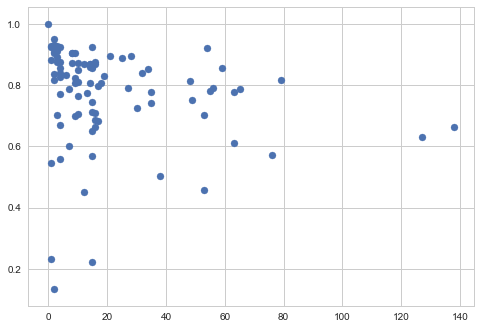

In [87]:
plt.scatter(pd_result['VP']+pd_result['FN'],pd_result['DSC'])

In [104]:
pd_result['cat']=pd.cut(pd.Series(pd_result['VP']+pd_result['FN']),5)

In [105]:
pd_result

,id,DSC,MTV_pred,MTV_gt,FN,VP,FP,FN_vox,VP_vox,FP_vox,VN_vox,cat
0,11011106051004,0.903881,15813,16605.0,0,8,1,1954.0,14651.0,1162.0,4176537.0,"(-0.138, 27.6]"
1,51011103071003,0.664575,2083,1423.0,2,14,2,258.0,1165.0,918.0,4191963.0,"(-0.138, 27.6]"
2,11011102321009,0.817447,31763,27480.0,14,65,6,3266.0,24214.0,7549.0,4159275.0,"(55.2, 82.8]"
3,11011101071031,0.809213,4980,3443.0,0,10,4,35.0,3408.0,1572.0,4189289.0,"(-0.138, 27.6]"
4,11011101171005,0.701721,657,389.0,0,3,2,22.0,367.0,290.0,4193625.0,"(-0.138, 27.6]"
5,11011101091022,0.923655,5594,5841.0,0,1,0,560.0,5281.0,313.0,4188150.0,"(-0.138, 27.6]"
6,11011109131005,0.840956,849,1075.0,0,4,1,266.0,809.0,40.0,4193189.0,"(-0.138, 27.6]"
7,11011101241005,0.648790,10144,5519.0,0,15,22,438.0,5081.0,5063.0,4183722.0,"(-0.138, 27.6]"
8,11011101091010,0.781671,14863,15843.0,4,51,3,3842.0,12001.0,2862.0,4175599.0,"(27.6, 55.2]"
9,11011101211003,0.725601,9121,11105.0,2,28,16,3767.0,7338.0,1783.0,4181416.0,"(27.6, 55.2]"


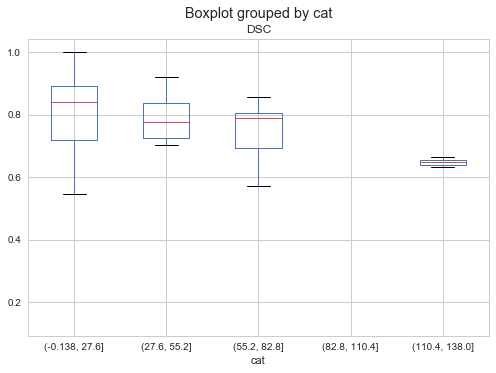

In [106]:
pd_result.boxplot(column='DSC',by='cat')

In [61]:
F1_score=(2*Se_vox*Sp_vox)/(Se_vox+Sp_vox)


In [62]:
F1_score

0.8678697057981831

In [63]:
### ENLEVE TROIS PATIENTS dt pb
#pd_result=pd_result.drop(pd_result[pd_result['id']=='11011101391006'].index) # lesion du genou non présente sur l'examen 
pd_result=pd_result.drop(pd_result[pd_result['id']=='11011101331012'].index) # masque inversé
#pd_result=pd_result.drop(pd_result[pd_result['id']=='11011101071009'].index) # lésion du genou non présente


In [84]:
import scipy
pd_result

,id,DSC,MTV_pred,MTV_gt,FN,VP,FP,FN_vox,VP_vox,FP_vox,VN_vox
0,11011106051004,0.903881,15813,16605.0,0,8,1,1954.0,14651.0,1162.0,4176537.0
1,51011103071003,0.664575,2083,1423.0,2,14,2,258.0,1165.0,918.0,4191963.0
2,11011102321009,0.817447,31763,27480.0,14,65,6,3266.0,24214.0,7549.0,4159275.0
3,11011101071031,0.809213,4980,3443.0,0,10,4,35.0,3408.0,1572.0,4189289.0
4,11011101171005,0.701721,657,389.0,0,3,2,22.0,367.0,290.0,4193625.0
5,11011101091022,0.923655,5594,5841.0,0,1,0,560.0,5281.0,313.0,4188150.0
6,11011109131005,0.840956,849,1075.0,0,4,1,266.0,809.0,40.0,4193189.0
7,11011101241005,0.648790,10144,5519.0,0,15,22,438.0,5081.0,5063.0,4183722.0
8,11011101091010,0.781671,14863,15843.0,4,51,3,3842.0,12001.0,2862.0,4175599.0
9,11011101211003,0.725601,9121,11105.0,2,28,16,3767.0,7338.0,1783.0,4181416.0


In [85]:
print(np.mean(pd_result['VP']))
print(np.mean(pd_result['FN']))

18.5652173913
2.16304347826


In [74]:
pd_result['DSC'].quantile(q=0.75)


0.875073001849606

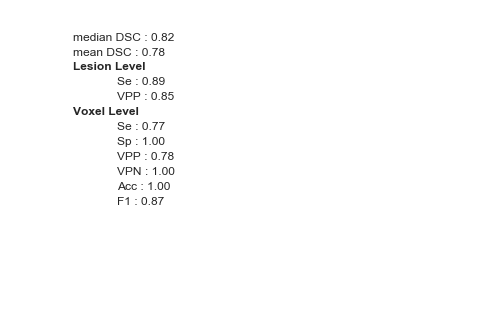

In [65]:
import seaborn as sns
fig,ax=plt.subplots()
sns.set_style("whitegrid")
ax.set_axis_off()
ax.text(0.1, 0.9, 'median DSC : {:.2f}'.format(pd_result['DSC'].median()), transform=ax.transAxes)
ax.text(0.1, 0.85, 'mean DSC : {:.2f}'.format(pd_result['DSC'].mean()), transform=ax.transAxes)
ax.text(0.1,0.8,'Lesion Level',fontweight='bold')
ax.text(0.2,0.75,'Se : {:.2f}'.format(Se))
ax.text(0.2,0.70,'VPP : {:.2f}'.format(VPP))
ax.text(0.1,0.65,'Voxel Level',fontweight='bold')
ax.text(0.2,0.60,'Se : {:.2f}'.format(Se_vox))
ax.text(0.2,0.55,'Sp : {:.2f}'.format(Sp_vox))
ax.text(0.2,0.50,'VPP : {:.2f}'.format(VPP_vox))
ax.text(0.2,0.45,'VPN : {:.2f}'.format(VPN_vox))
ax.text(0.2,0.40,'Acc : {:.2f}'.format(ACC_vox))
ax.text(0.2,0.35,'F1 : {:.2f}'.format(F1_score))

fig.savefig(name_model+'Results_m.jpg')

/Users/Paul/miniconda2/envs/python3/lib/python3.5/site-packages/seaborn/categorical.py:454: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


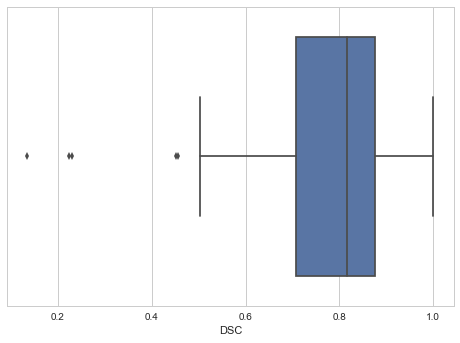

In [66]:
sns.boxplot(pd_result['DSC'])


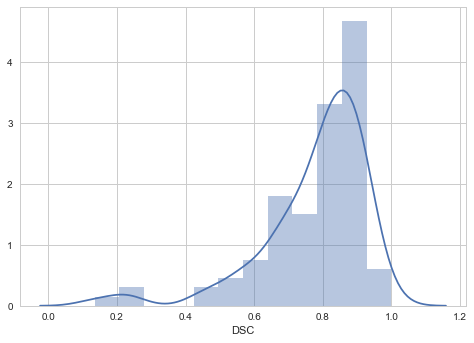

In [67]:

fig,ax=plt.subplots()
sns.distplot(pd_result['DSC'])
fig.savefig(name_model+'DSC_distrib_m.jpg')
 

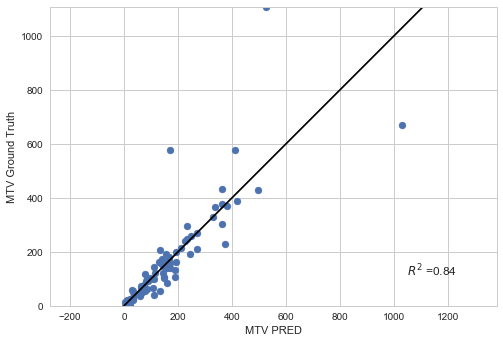

In [68]:
import scipy
fig,ax=plt.subplots()
slope, intercept, r_value, p_value, std_err=scipy.stats.linregress((pd_result['MTV_pred']),np.float64(pd_result['MTV_gt']))
str_R2='$R^2$ ='+str(("%.2f" % r_value))
#fig.gca().set_xlim(left=0)
#fig.gca().set_ylim(bottom=0)
max_x=np.max(pd_result['MTV_pred']/4**3)
max_y=np.max(pd_result['MTV_gt']/4**3)
max_all=np.max([max_x,max_y])
ax.scatter(np.float64(pd_result['MTV_pred']/4**3),np.float64(pd_result['MTV_gt']/4**3))
plt.plot(np.linspace(0,max_all,101) ,np.linspace(0,max_all,101),'k-') # identity line
ax.axis('equal')
ax.set_xlim((0,max_all))
ax.set_ylim((0,max_all))
ax.set_xlabel('MTV PRED')
ax.set_ylabel('MTV Ground Truth')
ax.text(0.8,0.1,str_R2,transform=ax.transAxes)
plt.show()
fig.savefig(name_model+'MTV_scatter_m.jpg')


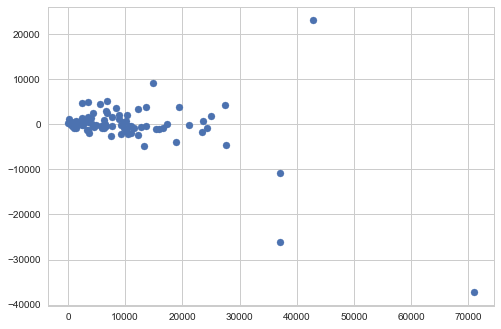

In [108]:
plt.scatter(pd_result['MTV_gt'],pd_result['MTV_pred']-pd_result['MTV_gt'])

In [409]:
500/(4**3)

7.8125

/Users/Paul/miniconda2/envs/python3/lib/python3.5/site-packages/ipykernel/__main__.py:2: RuntimeWarning: overflow encountered in exp
  from ipykernel import kernelapp as app


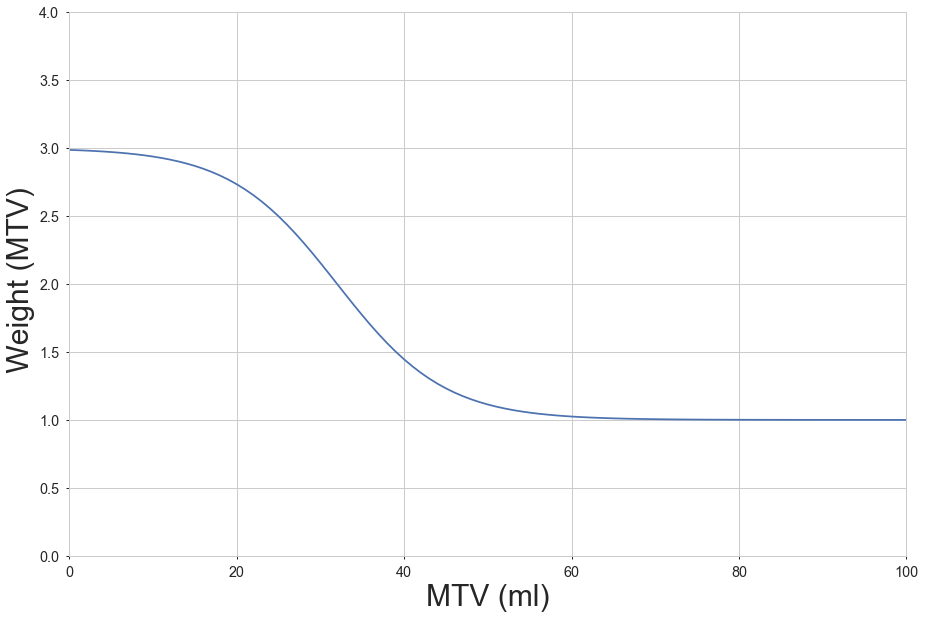